# Sanity check for trained model 
This is a mirror of 1.21 except that it evaluates a model trained with a single output class instead of two output classes. Previous models trained with 'absent' and 'present' encoded as different classes.

In [78]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
data_path = BASE_PATH / "data"
sys.path.append(str(BASE_PATH))
from src.utils import show_sample_from_df, clean_confidence_cats
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np




In [2]:
# Load the validation set
valid_set_path = BASE_PATH / 'data' / 'interim' / 'valid_set' 
valid_set = pd.read_pickle(valid_set_path / 'valid_df_verified.pkl')
valid_set.value_counts()

target_absence  target_presence  confidence_cat
1.0             0.0              0                 9947
0.0             1.0              2                  360
                                 3                  357
                                 1                  296
                                 4                   28
                                 0                    2
Name: count, dtype: int64

This validation set still contains 9947 unverified absent samples. All of the present samples have been listened to and categorized according to the following categories:
0. unverified
1. discard
2. hard to tell which class this should belong to
3. confirmed the correct class label
4. focal example
5. absent needs re-labelling as present
6. present needs re-labelling as absent

In [3]:
valid_set = valid_set.drop(columns=["target_absence"])

valid_set = clean_confidence_cats(valid_set)

In [4]:
valid_set.value_counts()

target_presence  confidence_cat
0.0              0                 9947
1.0              3                  357
                 4                   28
                 0                    2
Name: count, dtype: int64

In [5]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_presence']==0].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-296370.mp3'), 3.0, 6.0)

In [6]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'worthy-silence-1601700')
model.valid_metrics

{0: {'target_presence': {'au_roc': 0.9810387811634349,
   'avg_precision': 0.9696252555451484,
   'precision': 0.9808917197452229,
   'recall': 0.8105263157894737,
   'f1': 0.887608069164265,
   'support': 380},
  'precision': 0.9097283710833738,
  'recall': 0.8973684210526316,
  'f1': 0.8965885382140937,
  'jaccard': 0.8126805447292402,
  'hamming_loss': 0.10263157894736842,
  'map': 0.9696252555451484,
  'au_roc': 0.9810387811634349},
 1: {'target_presence': {'au_roc': 0.9947991689750693,
   'avg_precision': 0.9936215472504581,
   'precision': 0.9971181556195965,
   'recall': 0.9105263157894737,
   'f1': 0.951856946354883,
   'support': 380},
  'precision': 0.9573968502068927,
  'recall': 0.9539473684210527,
  'f1': 0.9538603773388539,
  'jaccard': 0.9117977100688501,
  'hamming_loss': 0.046052631578947366,
  'map': 0.9936215472504581,
  'au_roc': 0.9947991689750693},
 2: {'target_presence': {'au_roc': 0.9957894736842104,
   'avg_precision': 0.9957720497920045,
   'precision': 0.9462

In [7]:
valid_set.head()

target_presence  \
file                                              start_time end_time                    
../../data/raw/recordings/OSFL/recording-4478.mp3 0.0        3.0                   0.0   
                                                  1.5        4.5                   0.0   
                                                  3.0        6.0                   0.0   
                                                  4.5        7.5                   0.0   
                                                  6.0        9.0                   0.0   

                                                                       confidence_cat  
file                                              start_time end_time                  
../../data/raw/recordings/OSFL/recording-4478.mp3 0.0        3.0                    0  
                                                  1.5        4.5                    0  
                                                  3.0        6.0                    0  
                                                  4.5        7.5                    0  
                                                  6.0        9.0                    0

In [8]:
valid_set_preds = model.predict(valid_set, batch_size=32, activation_layer='sigmoid')

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/323 [00:00<?, ?it/s]

In [39]:
valid_set.columns, valid_set_preds.columns

(Index(['target_presence'], dtype='object'),
 Index(['target_presence'], dtype='object'))

# Sigmoid Activations
Choose Sigmoid, because Softmax doesn't make sense for the binary case. Sigmoid will also create a smoother probability distribution than softmax due to the lack of the exponent in the formula. 

In [40]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)
absent_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

In [41]:
# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)

In [42]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Label confidence {combined.iloc[counter].confidence_cat}")
    print("1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified")
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].target_presence}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [43]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-296370.mp3 3.0 6.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.999355137348175 
Actual = 1.0
Check below


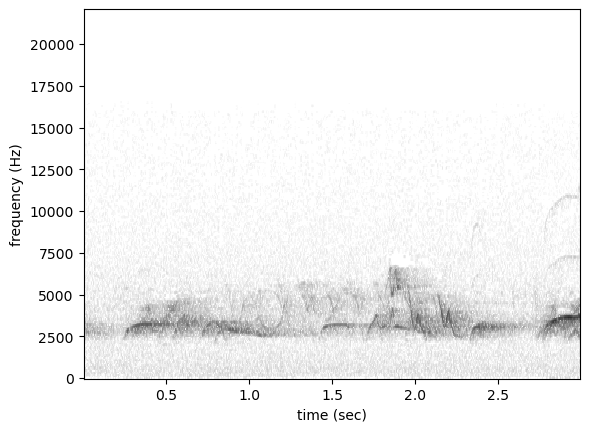

In [44]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-296360.mp3 18.0 21.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 4.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9999558925628662 
Actual = 1.0
Check below


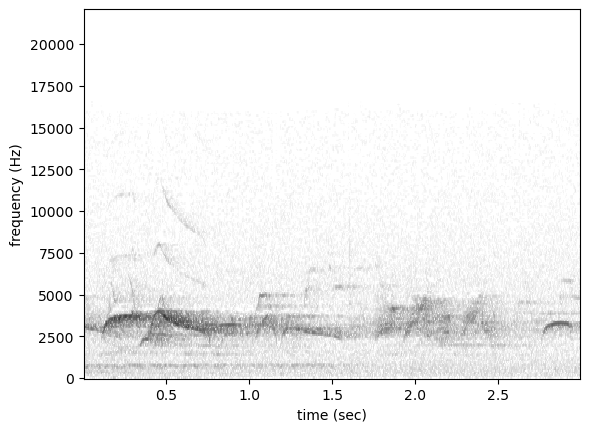

In [45]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-218582.mp3 28.5 31.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9997898936271667 
Actual = 1.0
Check below


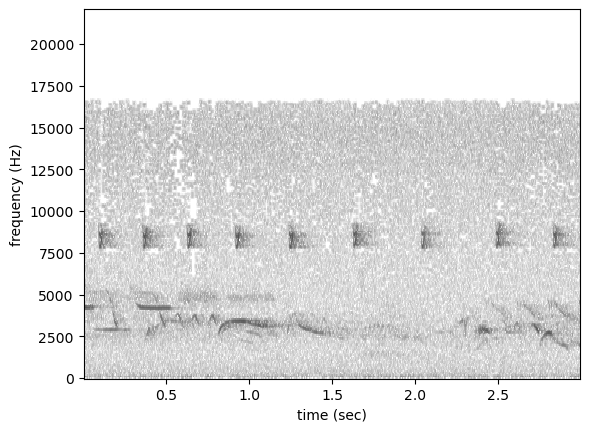

In [46]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-296355.mp3 3.0 6.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9993798732757568 
Actual = 1.0
Check below


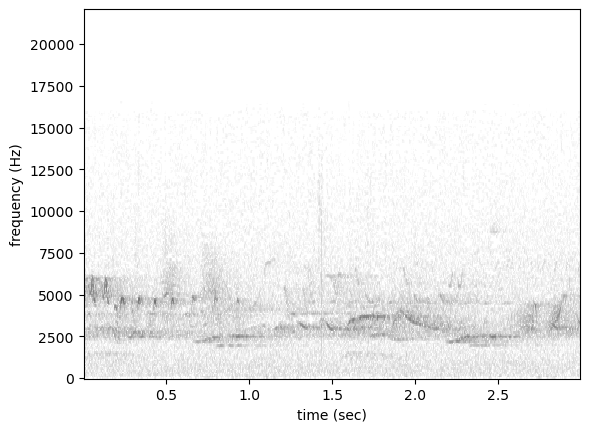

In [47]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-4787.mp3 78.0 81.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7938048, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9569181799888611 
Actual = 1.0
Check below


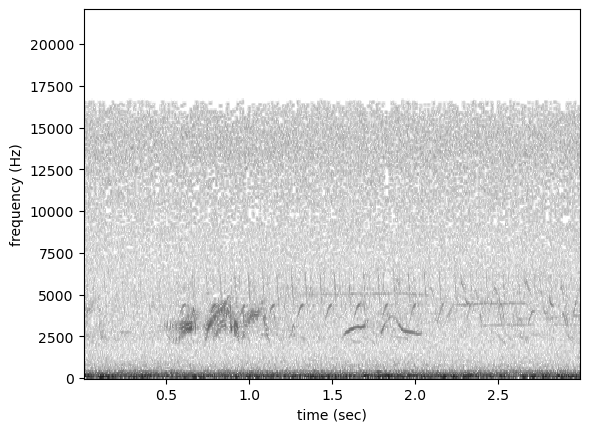

In [48]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292380.mp3 48.0 51.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9929248094558716 
Actual = 1.0
Check below


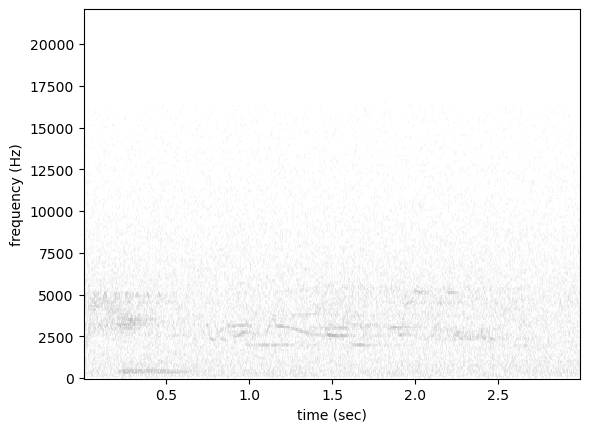

In [49]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-248819.mp3 21.0 24.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.99179607629776 
Actual = 1.0
Check below


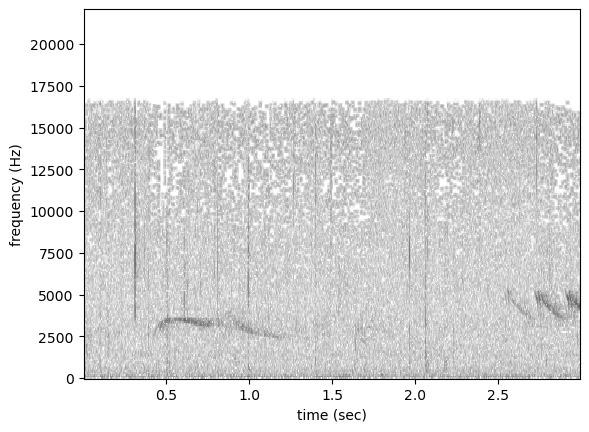

In [50]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-100182.mp3 7.5 10.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7937792, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9992792010307312 
Actual = 1.0
Check below


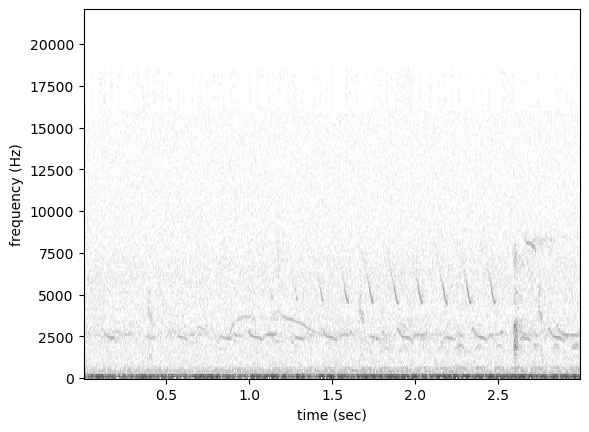

In [51]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-100182.mp3 115.5 118.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7937792, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9999827146530151 
Actual = 1.0
Check below


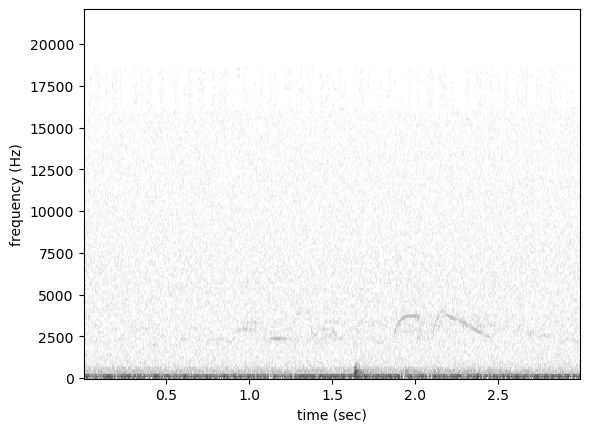

In [52]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-248819.mp3 27.0 30.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 3.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.9989595413208008 
Actual = 1.0
Check below


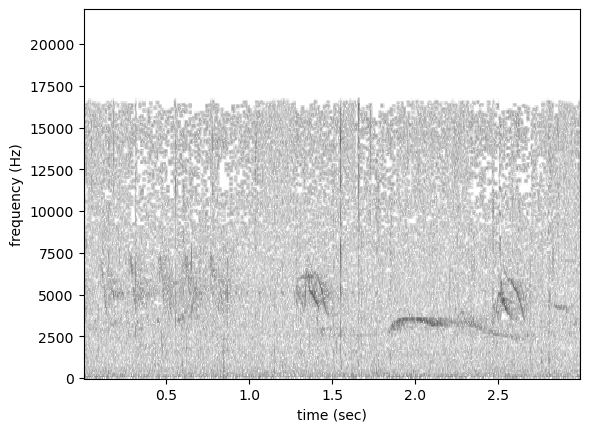

In [53]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-483110.flac 39.0 42.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0010987624991685152 
Actual = 0.0
Check below


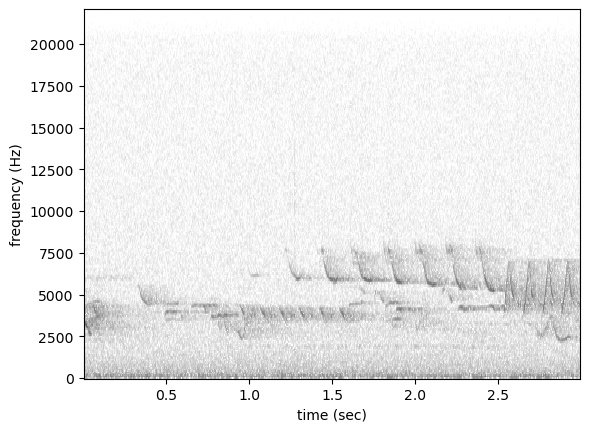

In [54]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-481585.flac 144.0 147.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0006496499408967793 
Actual = 0.0
Check below


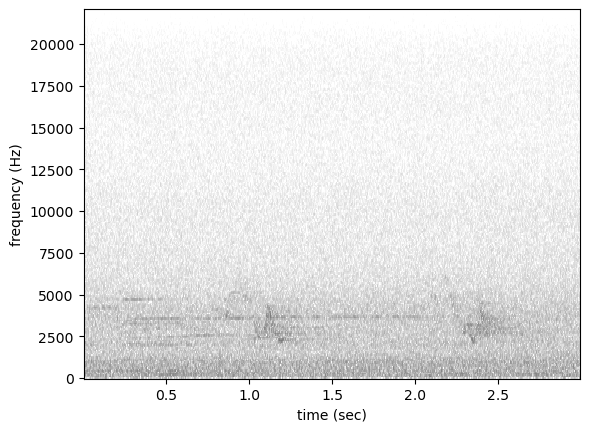

In [55]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-40342.mp3 37.5 40.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7938048, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.002330590272322297 
Actual = 0.0
Check below


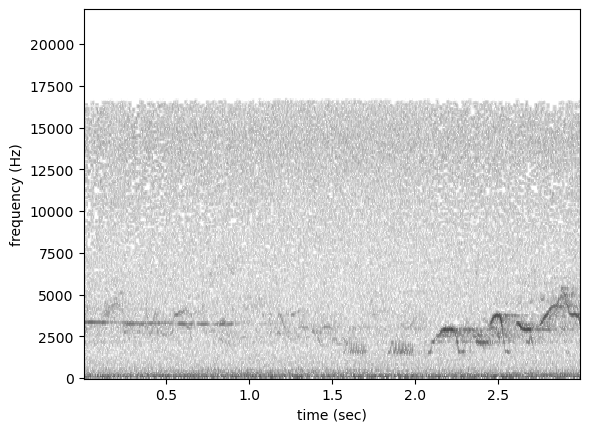

In [56]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553980.flac 30.0 33.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0011663440382108092 
Actual = 0.0
Check below


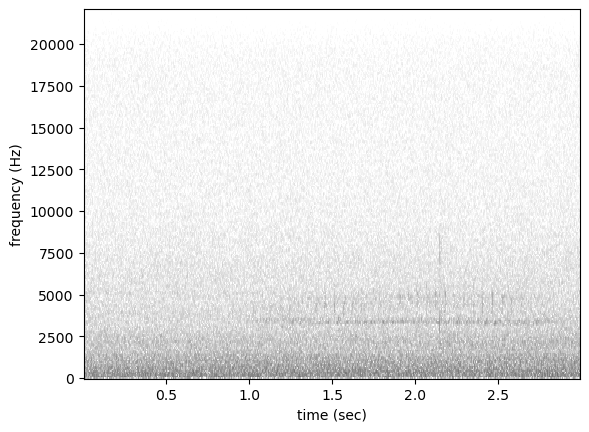

In [57]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-483110.flac 88.5 91.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.00022224868007469922 
Actual = 0.0
Check below


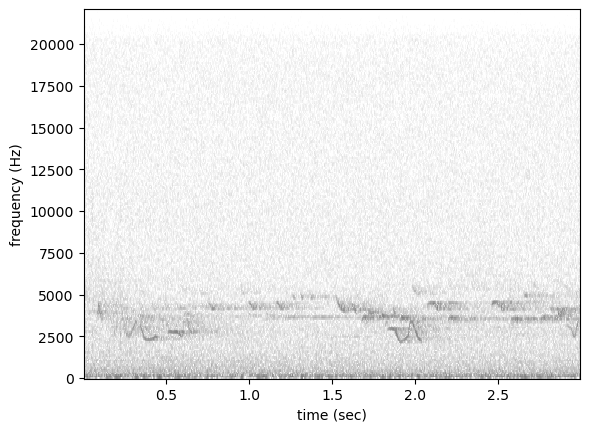

In [58]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-330554.flac 48.0 51.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.006348792929202318 
Actual = 0.0
Check below


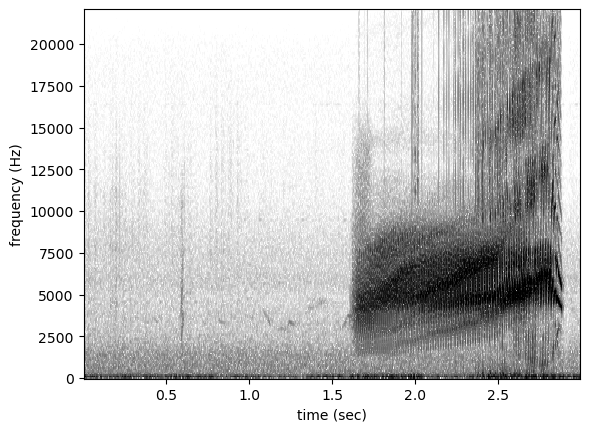

In [59]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-170398.flac 46.5 49.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0044966503046453 
Actual = 0.0
Check below


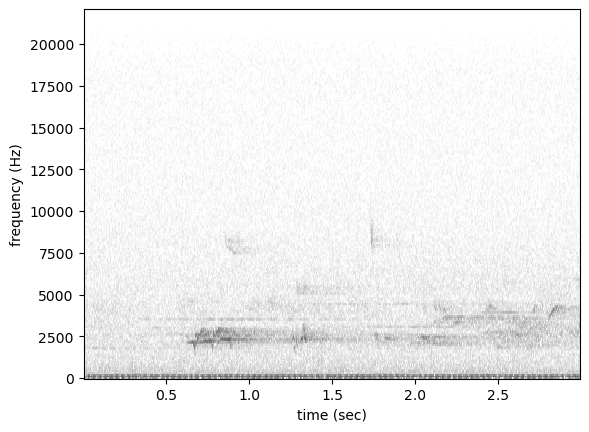

In [60]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554402.flac 7.5 10.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0029560921248048544 
Actual = 0.0
Check below


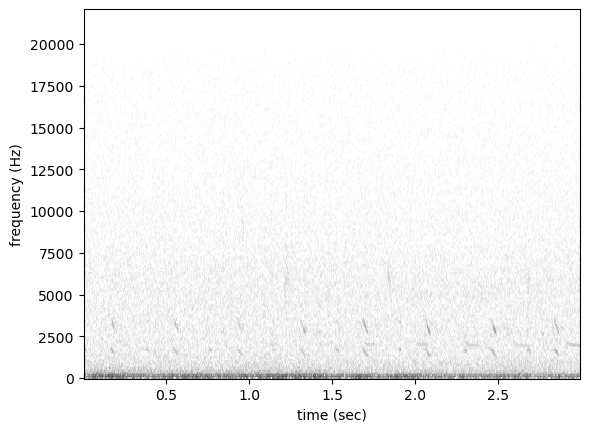

In [61]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292675.mp3 12.0 15.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.003606759710237384 
Actual = 0.0
Check below


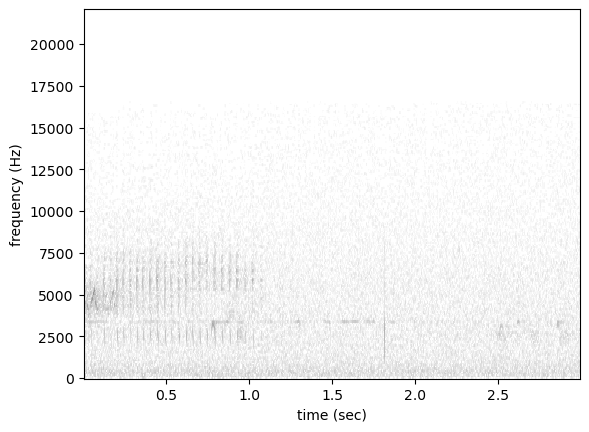

In [62]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-248719.mp3 13.5 16.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Label confidence 0.0
1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified
Present Prediction = 0.0003031794331036508 
Actual = 0.0
Check below


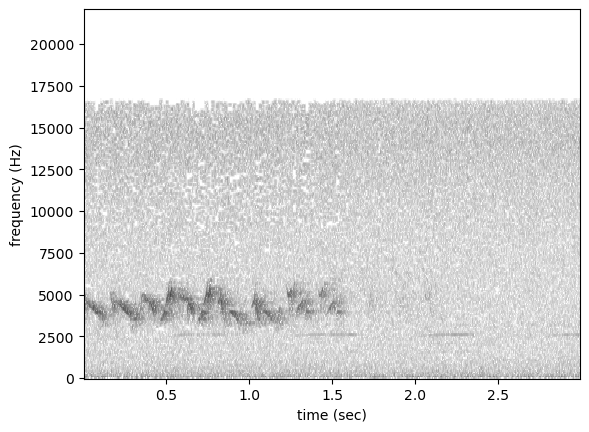

In [63]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 

In [64]:
valid_set_with_confidence = valid_set.copy()
valid_set = valid_set.drop(columns=["confidence_cat"])

KeyError: "['confidence_cat'] not found in axis"

In [65]:
valid_set_preds.round()

target_presence
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-4478.mp3  0.0        3.0                   0.0
                                                   1.5        4.5                   0.0
                                                   3.0        6.0                   0.0
                                                   4.5        7.5                   0.0
                                                   6.0        9.0                   0.0
...                                                                                 ...
../../data/raw/recordings/OSFL/recording-816752... 31.5       34.5                  0.0
                                                   33.0       36.0                  0.0
                                                   34.5       37.5                  0.0
                                                   36.0       39.0                  0.0
                                                   37.5       40.5                  0.0

[10334 rows x 1 columns]

### Plot a confusion matrix for different thresholds

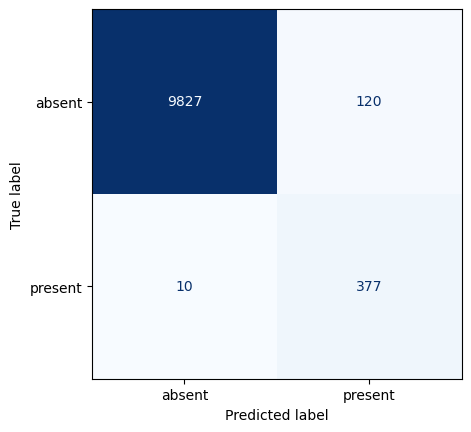

In [76]:
threshold = 0.9

def round_with_threshold(series, threshold=0.5):
    return series.apply(lambda x: 1 if x > threshold else 0)

cm = opso.metrics.M.confusion_matrix(valid_set.target_presence, round_with_threshold(valid_set_preds.target_presence,threshold).values)
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels= ["absent", "present"]).plot(cmap='Blues', colorbar=False)


# Plot top losses

In [79]:
valid_set_preds_renamed = valid_set_preds.rename(columns = {'target_presence':'present_pred'})
combined_full = pd.concat([valid_set_with_confidence, valid_set_preds_renamed], axis=1)

combined_full['loss'] = np.abs(combined_full['target_presence'] - combined_full['present_pred'])
top_losses = combined_full.sort_values(by='loss', ascending=False)
best_guesses = combined_full.sort_values(by='loss', ascending=True)
confidence_sorted = combined_full.sort_values(by='present_pred', ascending=False)

top_losses.head()


,,,target_presence,present_pred,loss
file,start_time,end_time,,,
../../data/raw/recordings/OSFL/recording-296360.mp3,0.0,3.0,0.0,0.999995,0.999995
../../data/raw/recordings/OSFL/recording-295476.mp3,1.5,4.5,0.0,0.999966,0.999966
../../data/raw/recordings/OSFL/recording-538300.flac,268.5,271.5,0.0,0.999905,0.999905
../../data/raw/recordings/OSFL/recording-554941.flac,16.5,19.5,0.0,0.999886,0.999886
../../data/raw/recordings/OSFL/recording-622473.flac,1.5,4.5,0.0,0.999715,0.999715


# Export the predictions to file

In [ ]:
# Export the predictions on the full validation set
# combined_full.to_pickle(data_path / "processed" / "osfl_model_predictions" / "validation_set_predictions.pkl")

In [80]:
idx=0

In [81]:

def show_false_negatives(idx):
    df = top_losses.loc[top_losses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_false_positives(idx):
    df = top_losses.loc[top_losses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_positives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_negatives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_predictions_by_confidence(idx, df):
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)



In [125]:
idx = 0

Model Confidence = 0.9996408224105835
Actual = 0.0


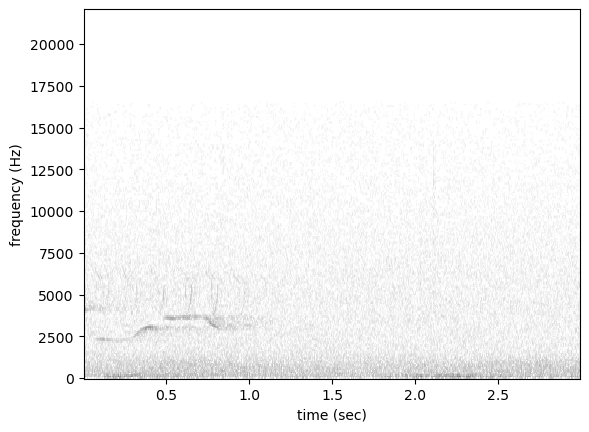

In [133]:
show_false_positives(idx)
idx+=1

Model Confidence = 0.9883010983467102
Actual = 1.0


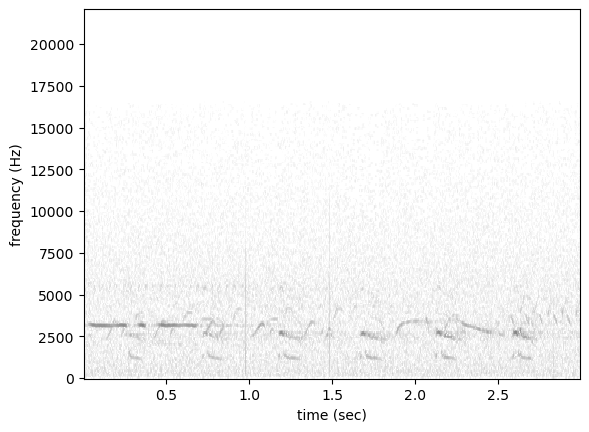

In [123]:
show_false_negatives(idx)
idx+=1

In [312]:
idx=0

Model Confidence = 0.9999822378158569
Actual = 1.0


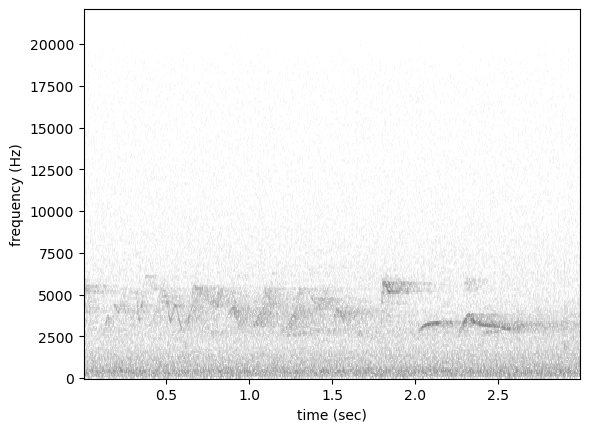

In [369]:
show_true_positives(idx)
idx+=1

In [ ]:
idx=0

Model Confidence = 0.06780225783586502
Actual = 0.0


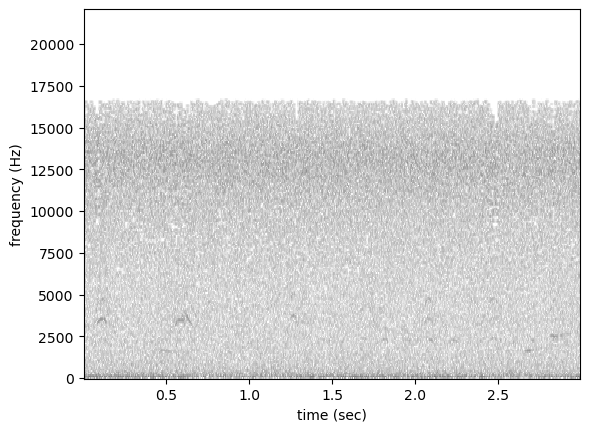

In [303]:
show_true_negatives(9000)
idx+=1

In [ ]:
idx=0

Model Confidence = 0.012884799391031265
Actual = 0.0
../../data/raw/recordings/OSFL/recording-294900.mp3 0.0 3.0


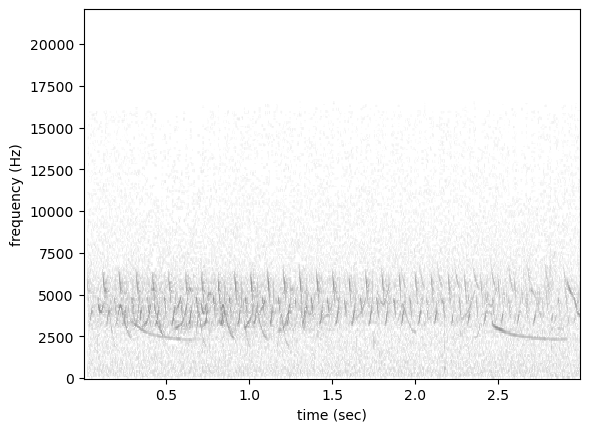

In [ ]:
show_predictions_by_confidence(idx, confidence_sorted)
idx+=1

In [306]:
def verify_top_loss_samples(df: pd.DataFrame):
    # Filter the split dataset further into unverified and present tags.
    unverified = df[df['confidence_cat'] == 0]

    # Set the confidence cat to 0 so that any skipped clips or crashes don't get saved as previous confidence.
    confidence = 0

    # Choose the top clip from the loss sorted df 
    clip = unverified.index[0]
    path, offset, end_time = clip
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spec = Spectrogram.from_audio(audio)
    print(df.loc[clip])
    audio.show_widget()
    spec.plot()
    user_confidence = input("enter confidence. 1=Discard, 2=Unsure, 3=Verified, 4=Focal, 5=swap-label")

    # save the user input confidence back to the original dataframe.


    df.loc[clip, 'confidence_cat'] = int(user_confidence)
    
    # display the counts
    print(f"added confidence tag {user_confidence} to the dataframe.")
    print(df.loc[df.target_presence == 1.0].value_counts())

    return df

In [307]:
top_losses = verify_top_loss_samples(top_losses)


KeyError: 'confidence_cat'

In [ ]:
top_losses.confidence_cat.value_counts()

confidence_cat
0    9938
2     363
3     359
1     296
4      28
5       6
Name: count, dtype: int64

In [ ]:
top_losses.head()

,,,target_presence,confidence_cat,present_pred,loss
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-295476.mp3,1.5,4.5,0.0,5,0.999994,0.999994
../../data/raw/recordings/OSFL/recording-296360.mp3,0.0,3.0,0.0,5,0.999949,0.999949
../../data/raw/recordings/OSFL/recording-554938.flac,30.0,33.0,0.0,3,0.999912,0.999912
../../data/raw/recordings/OSFL/recording-538300.flac,268.5,271.5,0.0,5,0.999899,0.999899
../../data/raw/recordings/OSFL/recording-554941.flac,16.5,19.5,0.0,5,0.999899,0.999899


<Axes: xlabel='file,start_time,end_time'>

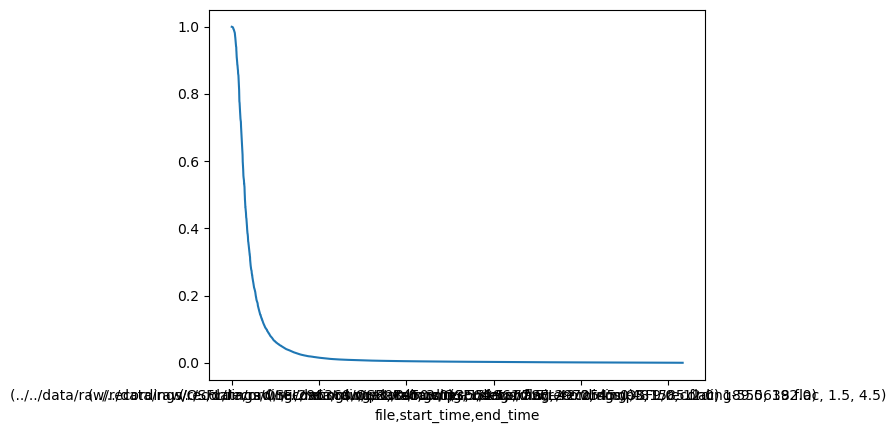

In [310]:
top_losses.loss.plot()